In [1]:
import cv2
import numpy as np
import glob
from scipy.misc import imresize
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import re

from keras.preprocessing.image import img_to_array
from vis.utils import utils
from vis.visualization import visualize_cam
from keras.models import model_from_json

def natural_key(string_):
    """See http://www.codinghorror.com/blog/archives/001018.html"""
    return [int(s) if s.isdigit() else s for s in re.split(r'(\d+)', string_)]

Using TensorFlow backend.


In [2]:
# Load model
json_file = open('road_model.json', 'r')
json_model = json_file.read()
json_file.close()
model = model_from_json(json_model)
model.load_weights('road_model.h5')
print('Model loaded.')

/home/michael/anaconda3/lib/python3.5/site-packages/keras/engine/topology.py:1210: UserWarning: Update your `BatchNormalization` call to the Keras 2 API: `BatchNormalization(gamma_regularizer=None, input_dtype="float32", axis=-1, beta_regularizer=None, trainable=True, batch_input_shape=[None, 45,..., momentum=0.99, name="batchnormalization_2", epsilon=0.001)`
  return cls(**config)
/home/michael/anaconda3/lib/python3.5/site-packages/keras/engine/topology.py:1210: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(bias_constraint=None, use_bias=True, bias_regularizer=None, kernel_initializer="glorot_uniform", activation="linear", kernel_regularizer=None, padding="valid", data_format="channels_last", name="convolution2d_4", kernel_constraint=None, filters=64, trainable=True, kernel_size=(3, 3), strides=[1, 1], activity_regularizer=None)`
  return cls(**config)
/home/michael/anaconda3/lib/python3.5/site-packages/keras/engine/topology.py:1210: UserWarning: Update your `Drop

Model loaded.


In [3]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batchnormalization_2 (BatchN (None, 45, 80, 1)         4         
_________________________________________________________________
cropping2d_2 (Cropping2D)    (None, 29, 78, 1)         0         
_________________________________________________________________
convolution2d_4 (Conv2D)     (None, 27, 76, 64)        640       
_________________________________________________________________
activation_7 (Activation)    (None, 27, 76, 64)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 27, 76, 64)        0         
_________________________________________________________________
convolution2d_5 (Conv2D)     (None, 25, 74, 32)        18464     
_________________________________________________________________
activation_8 (Activation)    (None, 25, 74, 32)        0         
__________

In [4]:
# Load images
test_image_locs = glob.glob('my_vid/12/*.jpg')
test_image_locs = sorted(test_image_locs, key=natural_key)

In [5]:
# Pull the specific image to look at
original_img = mpimg.imread(test_image_locs[90])

img = cv2.cvtColor(np.copy(original_img),cv2.COLOR_RGB2GRAY)
img = imresize(img, (45, 80))
img = img[:,:,None]
img = (img / 255) * .8 + 1
img = np.array(img)
img = img[:,:,:]

### In the below, the second input is the layer index and the third is the "labels" to see the activations for. I have included all of them here, but you could also look at 0, 1 and 2 for the left line or 3, 4 and 5 for the right line only.

Layers 4, 6 and 8 have the best looking activation maps - interestingly meaning that a fourth convolutional layer may be unnecessary. Also interesting is that 7 and 9, if reversed, also show the lane lines fairly well in the non-active portions. Perhaps by averaging across these heatmaps, I could get a better approximation of where to draw the lines.

In [26]:
labels_show = [0,1,2,3,4,5]

# Input model, layer index, labels to show, image, and whether to overlay on original image
# Currently I am receiving an error from overlay and therefore have not done here
map4 = visualize_cam(model, 4, labels_show, img, overlay = False)
map5 = visualize_cam(model, 5, labels_show, img, overlay = False)
map6 = visualize_cam(model, 6, labels_show, img, overlay = False)
map7 = visualize_cam(model, 7, labels_show, img, overlay = False)
map8 = visualize_cam(model, 8, labels_show, img, overlay = False)
map9 = visualize_cam(model, 9, labels_show, img, overlay = False)
map10 = visualize_cam(model, 10, labels_show, img, overlay = False)

Working on filters: [0, 1, 2, 3, 4, 5]
Working on filters: [0, 1, 2, 3, 4, 5]
Working on filters: [0, 1, 2, 3, 4, 5]
Working on filters: [0, 1, 2, 3, 4, 5]
Working on filters: [0, 1, 2, 3, 4, 5]
Working on filters: [0, 1, 2, 3, 4, 5]
Working on filters: [0, 1, 2, 3, 4, 5]


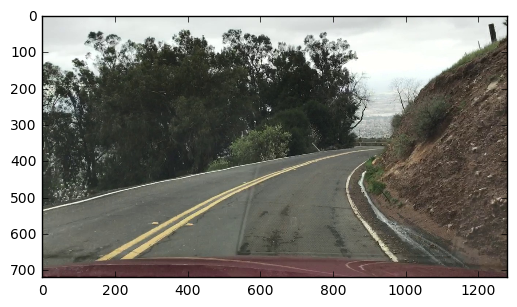

In [27]:
plt.imshow(original_img)
plt.show()

Original image, layer four and layer five

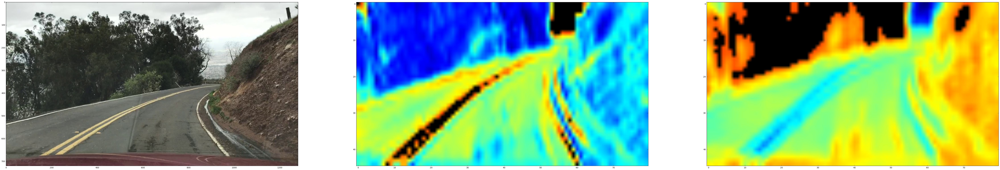

In [36]:
plt.figure(figsize=(90,160))
plt.subplot(131)
plt.imshow(original_img)
plt.subplot(132)
plt.imshow(map4)
plt.subplot(133)
plt.imshow(map5)
plt.show()

Layers six, seven and eight

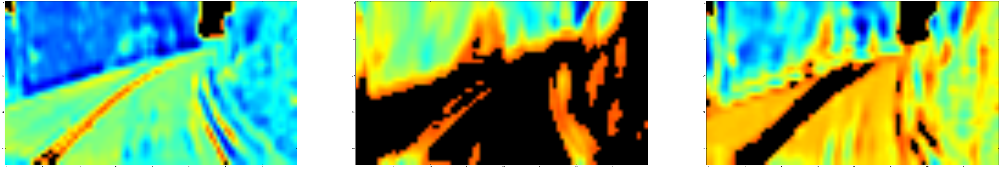

In [37]:
plt.figure(figsize=(90,160))
plt.subplot(131)
plt.imshow(map6)
plt.subplot(132)
plt.imshow(map7)
plt.subplot(133)
plt.imshow(map8)
plt.show()

Layers nine and ten. Further layer visualizations are almost all blue, as would be expected for non-convolutional.

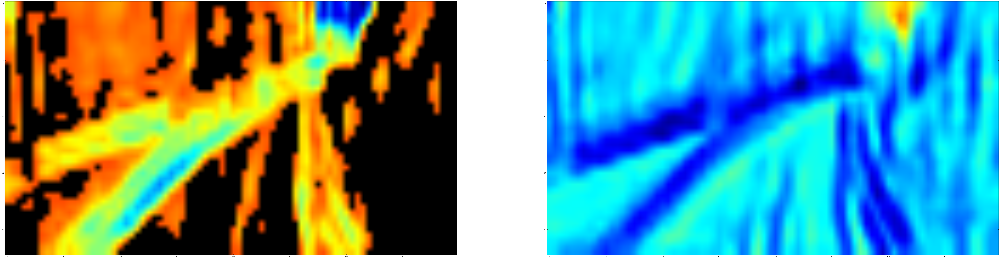

In [38]:
plt.figure(figsize=(90,160))
plt.subplot(121)
plt.imshow(map9)
plt.subplot(122)
plt.imshow(map10)
plt.show()